# Project 4B: West Nile Virus presence analysis

### Overall Contents:
- Background
- Data Cleaning
- [Exploratory Data Analysis](#3.-Exploratory-Data-Analysis) **(In this notebook)**
- Modeling 1 Logistic Regression
- Modeling 2 k-Nearest Neighbours
- Modeling 3 Random Forest
- Evaluation
- Conclusion and Recommendation

### Data Dictionary

The dataset contains the weather, location, testing and spraying in the City of Chicago.The data source below are obtained from [kaggle](https://www.kaggle.com/c/predict-west-nile-virus/data).

The dataset used for this analysis are as followed:--

* train_df (2007, 2009, 2011, 2013)
* spray_df (2011 to 2013)
* weather_df (2007 to 2014)
* test_df (2008, 2010, 2012, 2014)

|Feature|Type|Dataset|Description|
|:---|:---|:---|:---|
|**date**|*object*|train_df<br>test_df|The date that the West Nile Virus test is performed|
|**species**|*object*|train_df<br>test_df|The species of mosquitos|
|**trap**|*object*|train_df<br>test_df|Id of the trap|
|**addressnumberandstreet**|*object*|train_df<br>test_df|Approximate address returned from GeoCoder|
|**latitude**|*float64*|train_df<br>test_df|Latitude returned from GeoCoder|
|**longitude**|*float64*|train_df<br>test_df|Longitude returned from GeoCoder|
|**nummosquitos**|*int64*|train_df|Number of mosquitoes caught in this trap|
|**wnvpresent**|*int64*|train_df|Whether West Nile Virus was present in these mosquitos.<br>1 means West Nile Virus is present, and 0 means not present|
|**station**|*int64*|weather_df|Weather stations<br>Station 1 is located at Chicago O'Hare International Airport<br>Station 2 is located at Chicago Midway Intl Arpt|
|**date**|*object*|weather_df|The date of the weather information is collected|
|**tmax**|*int64*|weather_df|Maximum temperature (&deg;F)|
|**tmin**|*int64*|weather_df|Minimum temperature (&deg;F)|
|**tavg**|*int32*|weather_df|Average temperature (&deg;F)|
|**dewpoint**|*int64*|weather_df|Average dew point (&deg;F)|
|**wetbulb**|*int32*|weather_df|Average wet bulb (&deg;F)|
|**heat**|*int32*|weather_df|Heating degree days (Base 65&deg;F)|
|**cool**|*int32*|weather_df|Cooling degree days (Base 65&deg;F)|
|**codesum**|*object*|weather_df|Weather phenomena for significant weather types|
|**preciptotal**|*float64*|weather_df|Total precipitation (Inches and Hundredths)|
|**stnpressure**|*float64*|weather_df|Average station pressure (Inches of Hg)|
|**sealevel**|*float64*|weather_df|Average sea level pressure (Inches of Hg)|
|**resultspeed**|*float64*|weather_df|Resultant wind speed (miles per hour)|
|**resultdir**|*int64*|weather_df|Resultant wind direction (tens of whole degrees)|
|**avgspeed**|*float64*|weather_df|Average wind speed|
|**date**|*object*|spray_df|The date of the spray|
|**latitude**|*float64*|spray_df|Latitude of the spray|
|**longitude**|*float64*|spray_df|Longitude of the spray|

## 3. Exploratory Data Analysis

### 3.1 Libraries Import

In [1]:
# Imports:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re

from sklearn.feature_extraction.text import CountVectorizer
from IPython.display import clear_output

%config InlineBackend.figure_format = 'retina'
%matplotlib inline 
# Maximum display of columns
pd.options.display.max_colwidth = 400
pd.options.display.max_rows = 400

mapdata = np.loadtxt("../assets/mapdata_copyright_openstreetmap_contributors.txt")
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

### 3.2 Data Import

In [2]:
# Import data of train, weather, spray and test from csv
train_df = pd.read_csv('../data/train_df_clean.csv')
test_df = pd.read_csv("../data/test_df_clean.csv")
weather_df = pd.read_csv('../data/weather_df_clean.csv')
spray_df = pd.read_csv('../data/spray_df_clean.csv')

### 3.3 Feature Engineering

### 3.3.1 Change to datetime

In [3]:
train_df.date = pd.to_datetime(train_df.date)
test_df.date = pd.to_datetime(test_df.date)
spray_df.date = pd.to_datetime(spray_df.date)
weather_df.date = pd.to_datetime(weather_df.date)
print(f"train_df dtype is {train_df.dtypes.date}")
print(f"test_df dtype is {test_df.dtypes.date}")
print(f"spray_df dtype is {spray_df.dtypes.date}")
print(f"weather_df dtype is {weather_df.dtypes.date}")

train_df dtype is datetime64[ns]
test_df dtype is datetime64[ns]
spray_df dtype is datetime64[ns]
weather_df dtype is datetime64[ns]


### 3.3.2 Additional weather features

* Relative Humidity
* Average the values of station 1 and station 2 
* Tokenize and countvectorize the codesum to create as new features

In [4]:
def get_relative_humidity(dataframe):
    """
    Input: Dataframe which includes `tavg`, `tmax`, `tmin`, `dewpoint`
    Calculates missing `tavg`, converts `tavg` and `dewpoint` to degrees celcius, and calculates `saturation_vapour_pressure`,
    `actual_vapour_pressure`, and `relative_humidity`
    Output: Dataframe with `temp_celcius`, `dewpoint_celcius`, `saturation_vapour_pressure`, `actual_vapour_pressure`,
    and `relative_humidity`.
    """
    # Convert to celcius
    dataframe['temp_celcius'] = dataframe['tavg'].apply(lambda x : 5/9*(x-32))
    dataframe['dewpoint_celcius'] = dataframe['dewpoint'].apply(lambda x : 5/9*(x-32))
    # Calculate vapour pressures
    dataframe['saturation_vapour_pressure'] = 6.11*10.0**(7.5*dataframe['temp_celcius']/(237.7+dataframe['temp_celcius']))
    dataframe['actual_vapour_pressure'] = 6.11*10.0**(7.5*dataframe['dewpoint_celcius']/(237.7+dataframe['dewpoint_celcius']))
    # Calculate relative humidity
    dataframe['relative_humidity'] = dataframe['actual_vapour_pressure']/dataframe['saturation_vapour_pressure']
    dataframe.drop(['temp_celcius','dewpoint_celcius'], axis=1, inplace = True)

In [5]:
def average_days(dataframe):
    """
    Input: Dataframe
    Output: Averages the values of each date for each column for station 1 and 2 and creates a new dataframe with the
    average values. If column has string values, longest string value is returned.
    """
    date_list = list(dataframe['date'].unique())
    average_df = pd.DataFrame(columns=dataframe.columns)
    for index, date in enumerate(date_list):
        temp_dataframe = dataframe[dataframe['date'] == date]
        col_list = list(temp_dataframe.columns)
        temp_list = []
        for col in col_list: 
            try:
                temp_list.append(temp_dataframe[col].mean())
            except:
                temp_list.append(max(list(temp_dataframe[col]), key=len))
        temp_dict = dict(zip(col_list, temp_list))
        average_df = average_df.append(temp_dict, ignore_index=True)
        clear_output(wait=True)
        print(f'progress: {index+1}/{len(date_list)}')
    return average_df

In [6]:
# Calculate additional features data
get_relative_humidity(weather_df)

# Averaging the data between both station
average_dataframe = average_days(weather_df)

#using CV to tokenize the string
cvec = CountVectorizer(token_pattern=('(?u)\\S+'))
weather_cvec = cvec.fit_transform(average_dataframe.codesum)
weather_codesum = pd.DataFrame(weather_cvec.todense(),
                          columns=cvec.get_feature_names())

#merging back together again and drop station
weather_df = average_dataframe.merge(weather_codesum, how = 'outer', left_index=True, right_index=True).drop('codesum',axis=1)
weather_df = weather_df.drop('station', axis = 1)

progress: 1471/1471


### 3.3.3 Merging Train/Test with Weather

In [7]:
train_df = train_df.merge(weather_df, on= 'date')
test_df = test_df.merge(weather_df, on= 'date')

### 3.4 Analysis - Weather with number of mosquitos

#### 3.4.1 Correlations of weather with number of mosquitos

In [8]:
# Create dataframe with selected features
relative_humidity_mosquitos = train_df[['date','dewpoint','wetbulb','heat','cool','preciptotal','stnpressure','sealevel','resultspeed','resultdir','avgspeed','relative_humidity','tavg','br','dz','fg','hz', 'ra','ts','tsra','vcts','nummosquitos','wnvpresent']].set_index('date',drop=True)

In [9]:
# Create dataframe for total number of mosquitos per date
nummosquitos = relative_humidity_mosquitos.groupby('date').sum()['nummosquitos'].reset_index().set_index('date', drop=True)

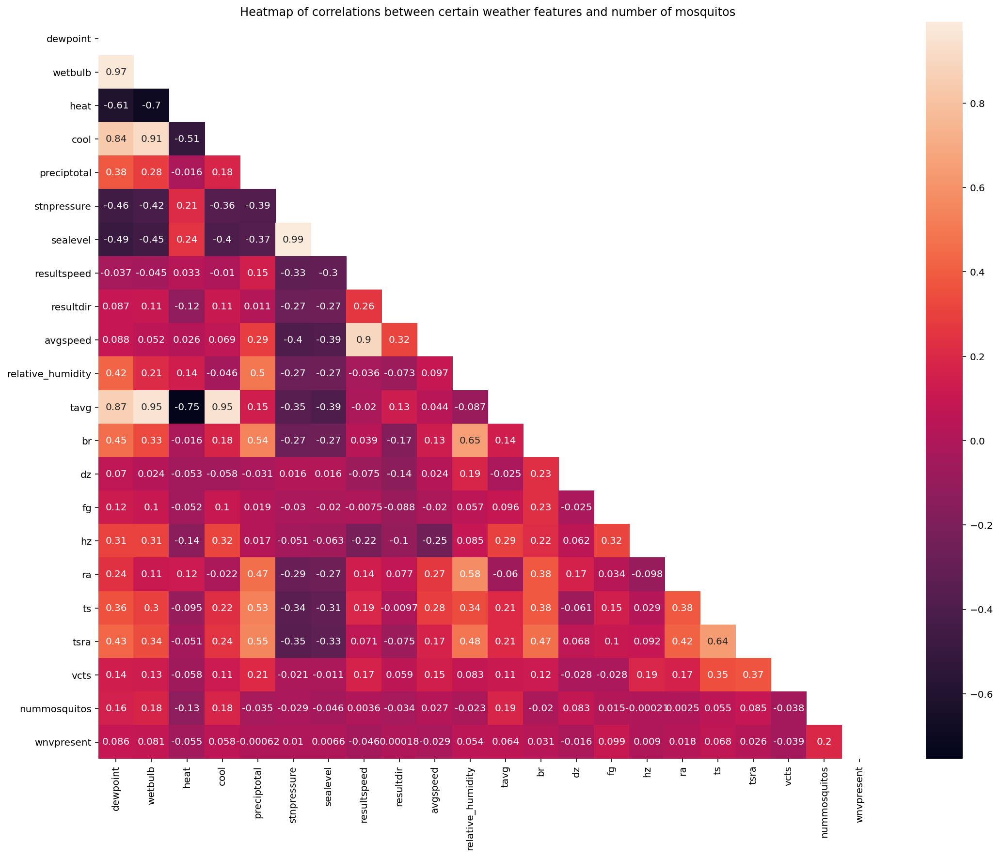

In [10]:
# Plot heatmap of weather features and number of mosquitos
plt.figure(figsize=(18,14))
sns.heatmap(relative_humidity_mosquitos.corr(), annot=True, mask=np.triu(relative_humidity_mosquitos.corr()))
plt.title('Heatmap of correlations between certain weather features and number of mosquitos');

**Analysis: There does not appear to be much correlation between the features and number of mosquitos based on the heatmap, however, we know this to be untrue based on scientific research.**

#### 3.4.2 Relationships of weather features with number of mosquitos

#### 3.4.2.1  Define functions

In [11]:
def feature_year_corr(year, dataframe):
    """
    Input: `feature` to compare as a string
    Output: plots of feature against number of mosquitos by month
    """
    months = ['Jun', 'Jul','Aug','Sep','Oct','Nov']
    fig, ax = plt.subplots(nrows=10, ncols=2, figsize=(15,50), sharey=False, sharex=False)
    ax = ax.flatten()

             
    for idx, col in enumerate(dataframe.drop(['nummosquitos','wnvpresent'],axis=1).columns):
        dataframe[year][col].resample('M').mean().plot(color = 'red', marker = 'o', ax=ax[idx])
        ax[idx].title.set_text(f'Num of mosquitos in {year} against {col}')
        ax[idx].set_ylabel(f"{col}", fontsize = 14)
        ax[idx].set_xlabel(f"May to Oct {year}", fontsize = 14)
        ax[idx].xaxis.tick_bottom()
        ax2 = ax[idx].twinx()
        nummosquitos[year].nummosquitos.resample('M').mean().plot(color = 'blue', marker = 'o')
        ax2.set_ylabel("total mosquitos", fontsize = 14)
        ax[idx].legend(loc='upper right')
        ax2.legend(loc='upper right',bbox_to_anchor=(1,0.9))


    # Allow the plot to adjust spacing
    fig.tight_layout() 

    # Save the plot as an image file
    plt.savefig(f'../imgs/{year}_mosquitos.png')

In [12]:
# Plot histograms to identify the distribution of the data
def feature_mosquito(feature, dataframe):
    """
    Input: `feature` to compare as a string
    Output: plots of feature against number of mosquitos by month over the yearss
    """
    years = ['2007','2009','2011','2013']
    months = ['Jun', 'Jul','Aug','Sep','Oct','Nov']
    fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(15,10), sharey=True)
    ax = ax.flatten()

    for idx, year in enumerate(years):
        dataframe[year][feature].resample('M').mean().plot(color = 'red', marker = 'o', ax=ax[idx])
        ax[idx].title.set_text(f'Num of mosquitos in {year} against {feature}')
        ax[idx].set_ylabel(f"{feature}", fontsize = 14)
        ax[idx].set_xlabel(f"May to Oct {year}", fontsize = 14)
        ax2 = ax[idx].twinx()
        nummosquitos[year].nummosquitos.resample('M').mean().plot(color = 'blue', marker = 'o')
        ax[idx].legend(loc='upper right')
        ax2.legend(loc='upper right',bbox_to_anchor=(1,0.9))
        ax2.set_xlim(year+"-05",year+"10")
        ax2.set_ylim(0,3500)
        if idx%2 != 0:
            ax2.set_ylabel("total mosquitos", fontsize = 14)
        else:
            ax2.set_yticks([])

    # Allow the plot to adjust spacing
    fig.tight_layout() 

    # Save the plot as an image file
    plt.savefig(f'../imgs/{feature}_mosquitos.png')

#### 3.4.2.2  Weather features and the number of mosquitos in 2007

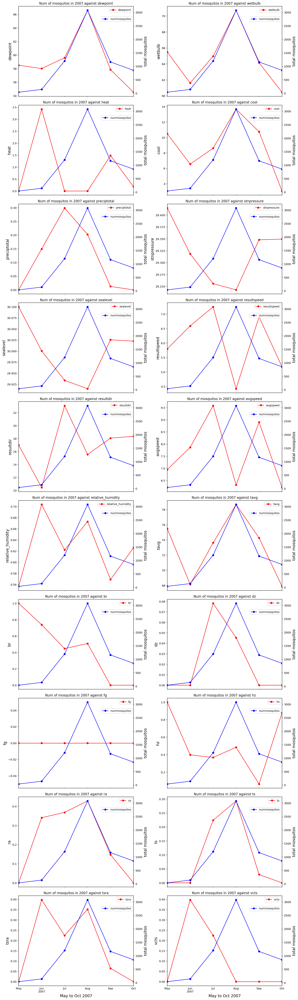

In [13]:
feature_year_corr('2007', relative_humidity_mosquitos)

We can see that some features such as temperature and humidity features are more correlated with the number of mosquito populations, on the other hand, phenomena such as fog and mist do not appear to be correlated.

#### 3.4.2.3  Relative humidity with number of mosquitos across 2007 to 2013

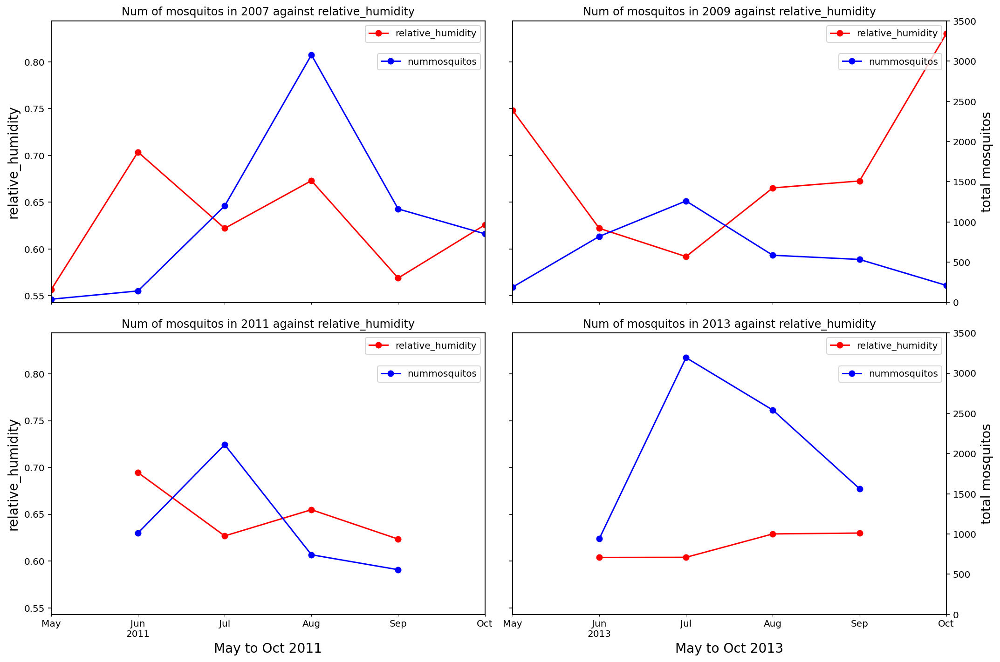

In [14]:
feature_mosquito('relative_humidity',relative_humidity_mosquitos)

It appears that mosquitos prefer relative humidity between 60-65%, and their populations are lower below or above this point.

#### 3.4.2.4  Average temperature with number of mosquitos across 2007 to 2013

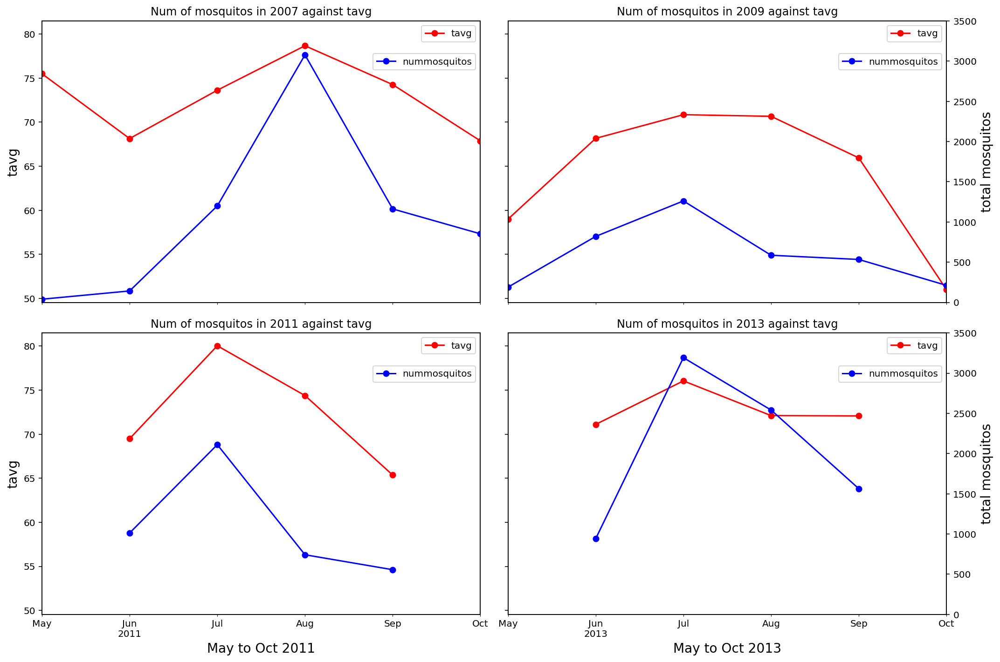

In [15]:
feature_mosquito('tavg', train_df.set_index('date'))

The population of mosquitos are very much correlated to the average temperatures across the months. This would likely be an important feature in our models.

#### 3.4.2.5  Dewpoint with number of mosquitos across 2007 to 2013

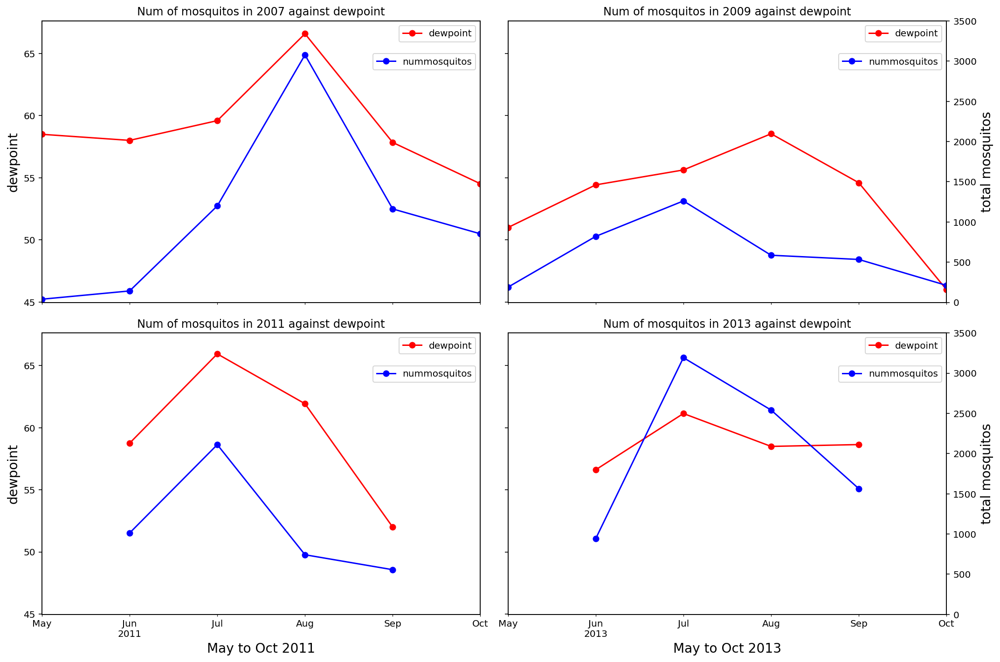

In [16]:
feature_mosquito('dewpoint', relative_humidity_mosquitos)

The population of mosquitos is also closely related to the dewpoint, hence this would also be likely a key feature.

#### 3.4.2.6  Station pressure with number of mosquitos across 2007 to 2013

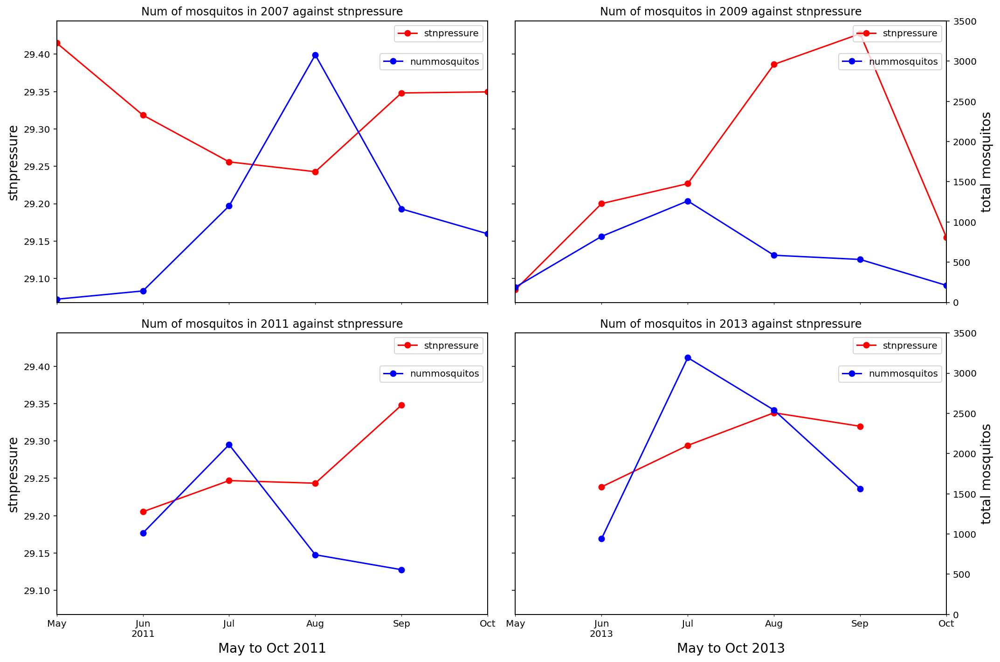

In [17]:
feature_mosquito('stnpressure', relative_humidity_mosquitos)

The relationship between stnpressure and mosquitos does not appear to be too correlated.

#### 3.4.2.7  Preciptation total with number of mosquitos across 2007 to 2013

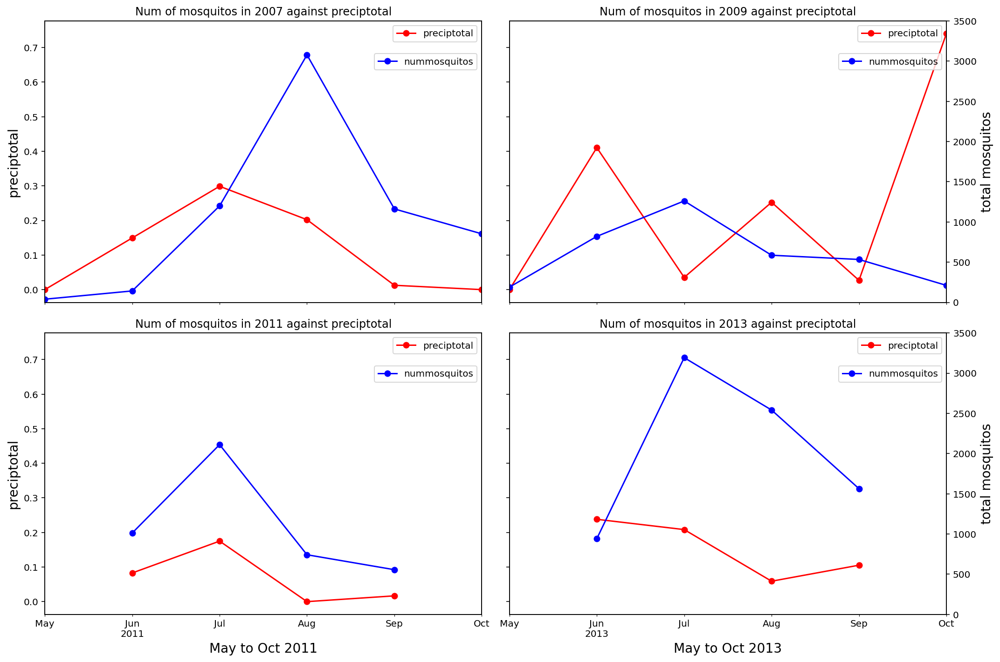

In [18]:
feature_mosquito('preciptotal', relative_humidity_mosquitos)

Mosquito populations tend to rise with more precipitation

#### 3.4.2.8  Cooling degree days with number of mosquitos across 2007 to 2013

Cooling degree days are an estimation of the amount of cooling required for a building with the use of 65&deg;F as a baseline.

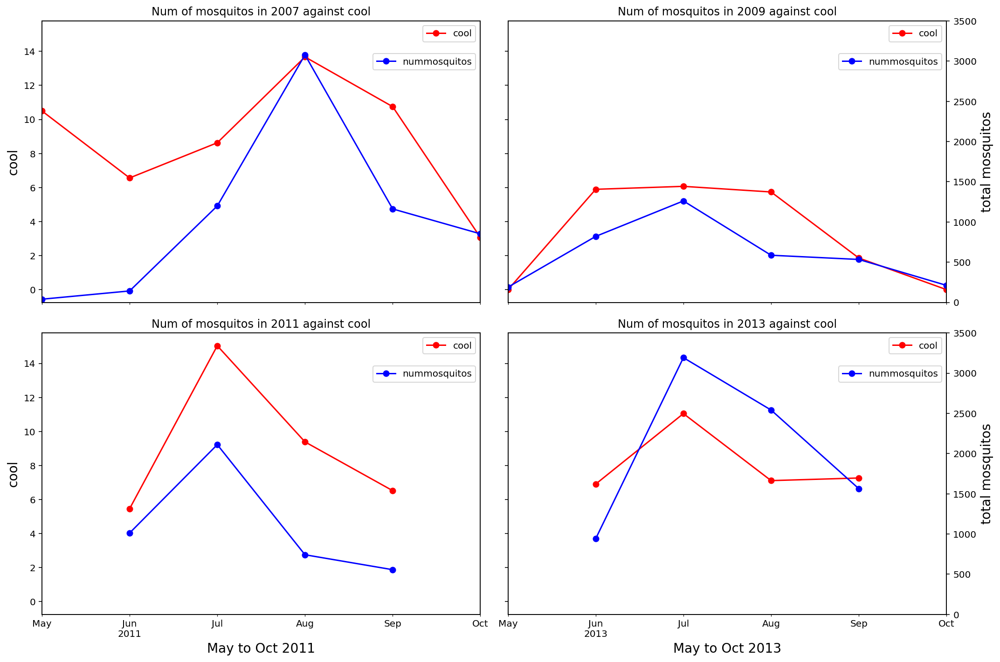

In [21]:
feature_mosquito('cool', relative_humidity_mosquitos)

The population of mosquitos is related to cooling days - this is another temperature feature so this makes sense

#### 3.4.2.9  Raining days with number of mosquitos across 2007 to 2013

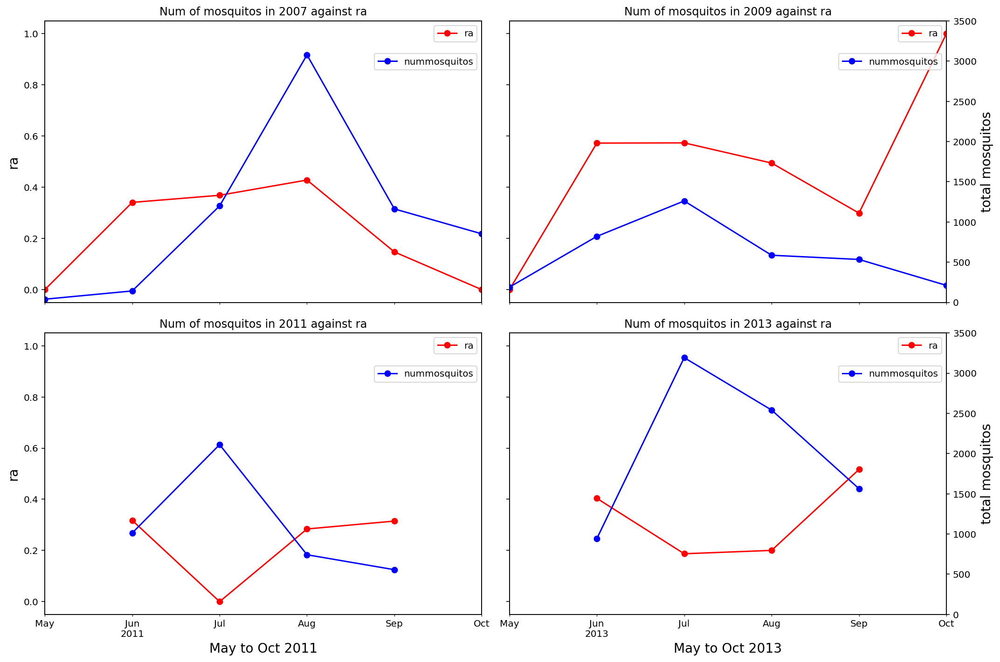

In [22]:
feature_mosquito('ra', relative_humidity_mosquitos)

Mosquito population appears to increase when there is rain, but 2011 and 2013 break this trend, hence it may not be an important feature for our models

#### 3.4.2.10  Thunderstorm with number of mosquitos across 2007 to 2013

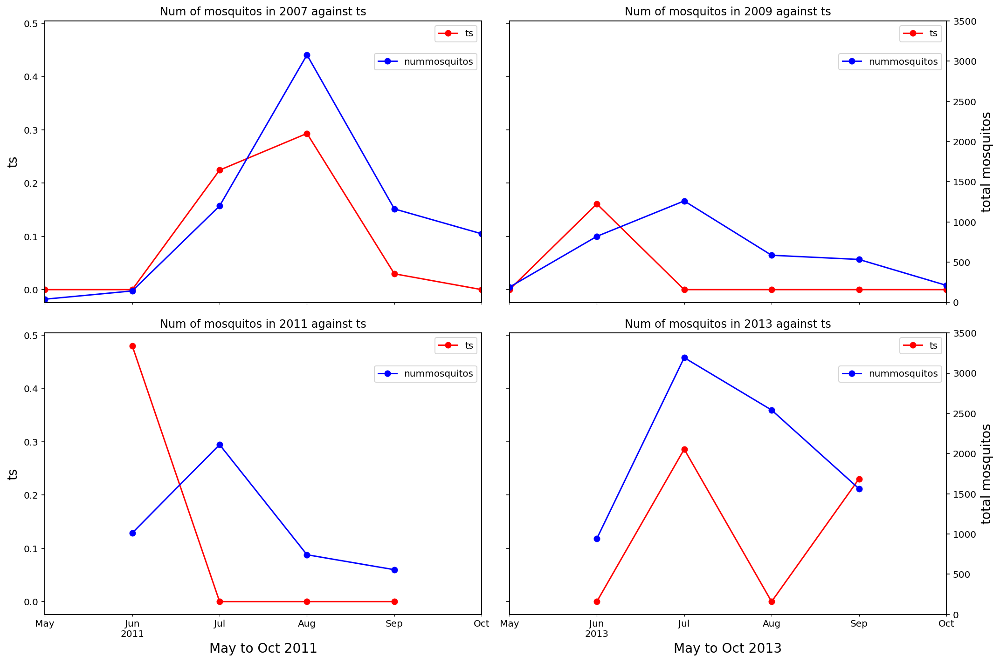

In [23]:
feature_mosquito('ts', relative_humidity_mosquitos)

Mosquito population appears to increase when there is thunderstorms, but 2011 and 2013 break this trend again, hence it may not be an important feature for our models

### 3.5 Analysis - Mosquitos and trap locations in Chicago

#### 3.5.1 Define functions

In [26]:
def plot_barplot(dataframe, x_data, y_data, hue_data, title, x_label, y_label,legend_label, orient, legend_location):
    """To plot a barplot with input of details.
    Orient can take a form of 'h' or 'v'. legend_location is a range of 0-10.
    hue_data can take a form of None. The output is a barplot"""
    plt.figure(figsize = (10,7))
    sns.barplot(x = x_data, y = y_data, hue = hue_data, data = dataframe, orient = orient)
    plt.xlabel(x_label, fontsize = 16)
    plt.xticks(fontsize = 14)
    plt.yticks(fontsize = 14)
    plt.ylabel(y_label, fontsize = 16)
    plt.legend(title = legend_label,prop = {'size' : 14}, title_fontsize = 14, loc = legend_location)
    plt.title((title +"\n"), weight = 'bold', fontsize = 20);
    return plt.show()

In [27]:
def wnv_normalizer(dataframe):
    """
    Input: dataframe with `species`, `wnvpresent` and `nummosquitos`
    Output: dataframe with `nummosquitos` normalized according to species
    """
    new_dataframe = pd.DataFrame(columns = dataframe.columns)
    for index, row in dataframe.iterrows():
        species = row['species']
        data = list(row)
        data[2] = row.nummosquitos/dataframe[dataframe['species'] == species]['nummosquitos'].sum()
        temp_dict = dict(zip(list(dataframe.columns), data))
        new_dataframe = new_dataframe.append(temp_dict, ignore_index=True)
    return new_dataframe

#### 3.5.2 Mosquitos, its species and presence of west nile virus across 2007 to 2013

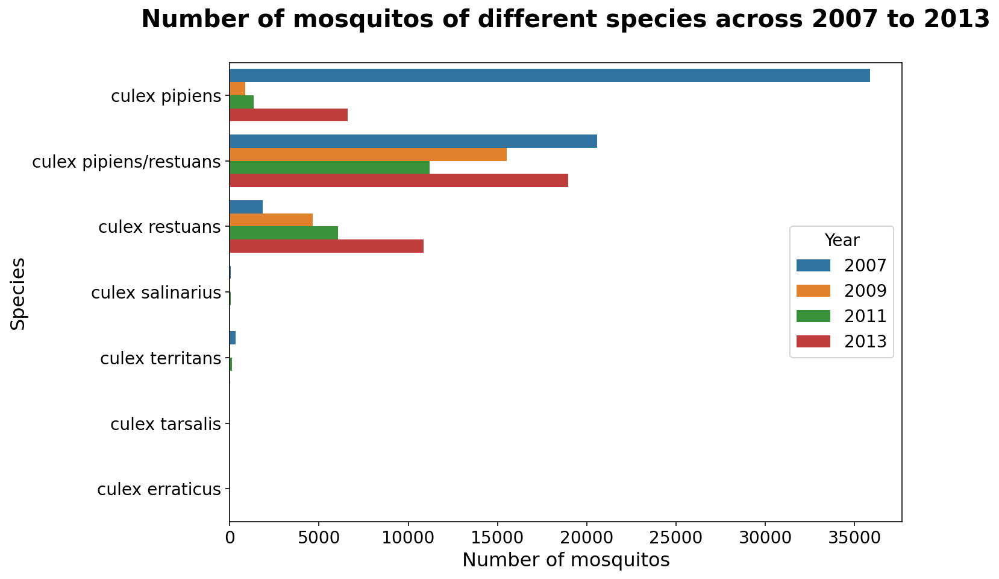

In [28]:
# Grouping and plot the number of mosquitos with its respective species in each year from 2007 to 2013.
train_yrspemos = train_df.groupby([train_df.date.dt.year, "species"]).sum()[["nummosquitos"]].reset_index()
plot_barplot(train_yrspemos,'nummosquitos','species', 'date', "Number of mosquitos of different species across 2007 to 2013", "Number of mosquitos","Species","Year",'h', 0)

**Analysis: Majority of the mosquito species caught in the trap belongs to** *culex pipiens* **or** *culex restuans*.

Six mosquitos species which are potential carrier of west nile virus were measured in Chicago across 2007 to 2013.[[3]](https://us.biogents.com/house-mosquitoes/) 
In 2007, the majority of the mosquito species caught in the trap is *culex pipiens*. In 2009 and 2011, there is a drop in number of mosquito caught with the highest being *culex pipiens/restuans*. There is an increase in number of mosquito caught in 2013, in both *culex pipiens* and *culex restuans*. There is a species of *culex pipiens/restuans* presence in addition of their respective *culex pipiens* and *culex restuans*. This suggests that the two species could not be differentiated and therefore exist the additional species section of *culex pipiens/restuans*.

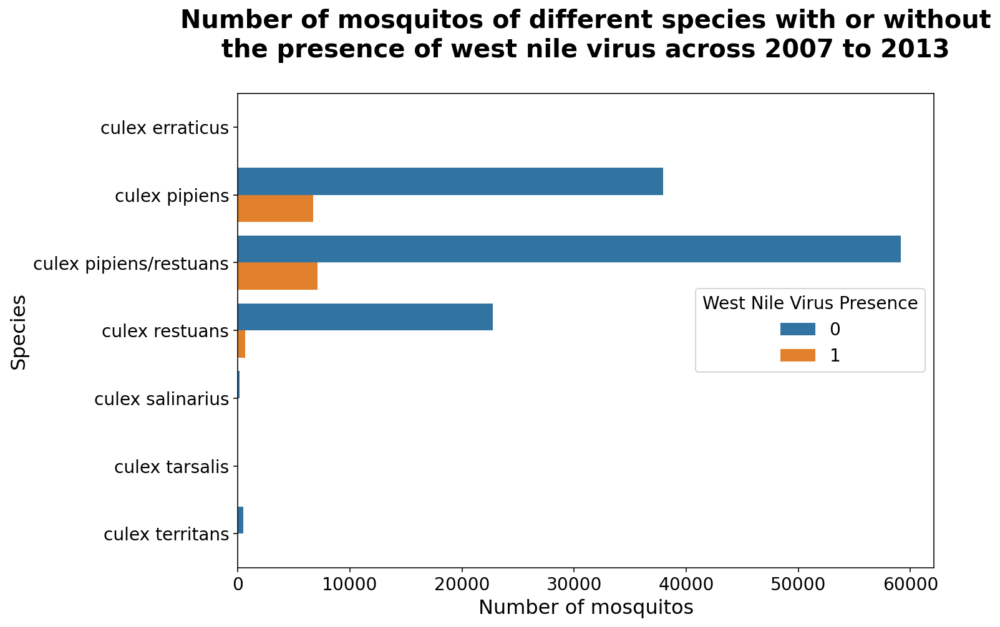

In [29]:
# Grouping the number of mosquitos of their respective species with or without the presence of west nile virus
train_spewnvmos = train_df.groupby(["species","wnvpresent"])["nummosquitos"].sum().reset_index()
plot_barplot(train_spewnvmos,'nummosquitos','species', 'wnvpresent', "Number of mosquitos of different species with or without\nthe presence of west nile virus across 2007 to 2013", "Number of mosquitos","Species",'West Nile Virus Presence','h', 0)

**Analysis: Majority of the mosquito with west nile virus caught in the trap belongs to** *culex pipiens* **or** *culex restuans*.

Majority of mosquitos carrier of west nile virus in Chicago are *culex pipiens/restuans*, *culex pipiens* and *culex restuans*. As the majority of the mosquitos with or without west nile virus caught belongs to these species, we will normalize the number of mosquitos to see if there are other mosquitos species which are also a carrier of west nile virus.

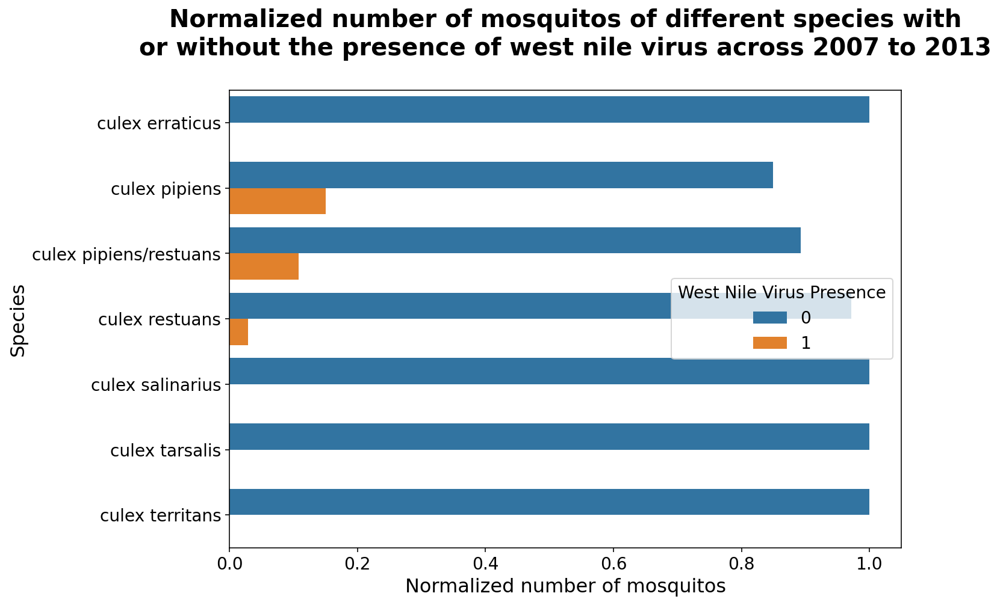

In [30]:
# Normalize the grouping the number of mosquitos of their respective species with or without the presence of west nile virus
train_spewnvnorm = wnv_normalizer(train_spewnvmos)
plot_barplot(train_spewnvnorm,'nummosquitos','species', 'wnvpresent', "Normalized number of mosquitos of different species with\nor without the presence of west nile virus across 2007 to 2013", "Normalized number of mosquitos","Species",'West Nile Virus Presence','h', 0)

**Analysis: Other species apart from** *culex pipiens* **or** *culex restuans* **do not have significantly high number of mosquitos with west nile virus.**

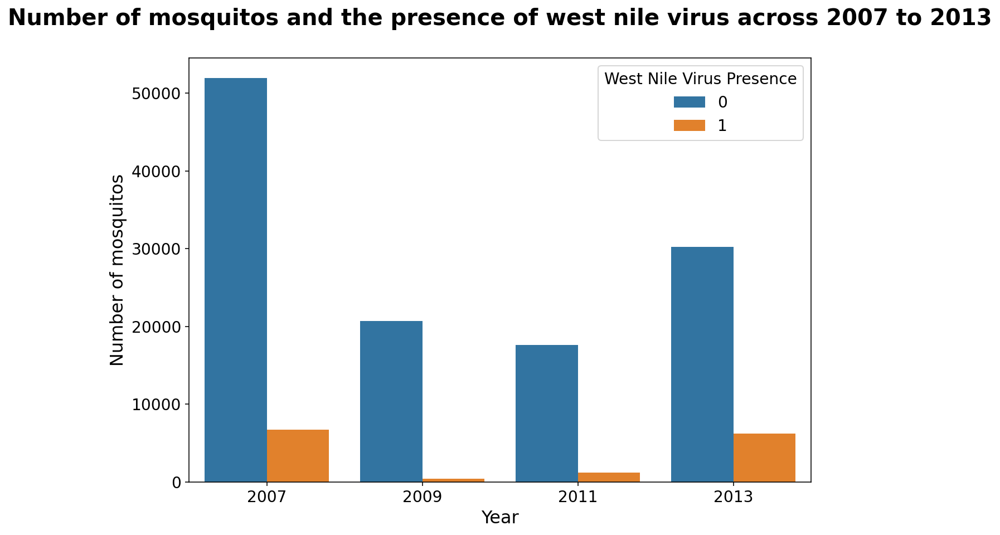

In [31]:
# Grouping and plotting the number of mosquitos and the presence of west nile virus across 2007 to 2013
train_yrwnvnum = train_df.groupby([train_df.date.dt.year,"wnvpresent"]).sum()[["nummosquitos"]].reset_index()
plot_barplot(train_yrwnvnum,'date','nummosquitos', 'wnvpresent', "Number of mosquitos and the presence of west nile virus across 2007 to 2013", "Year","Number of mosquitos",'West Nile Virus Presence', 'v', 0)

**Analysis: There is a high proportion of number of mosquitos present in Chicago in 2007. The number of mosquitos with west nile virus are high in 2007 and 2013.**

The high proportion of number of mosquitos in 2007 could be due to the high number of trap locations in 2007 in comparison with other years. In addition, with reference to section 3.4.2.4, 2007 has a longer period of summer that last from Jun to Oct in comparison with other years which last about Jun to Aug with an mean average temperature of 70&deg;F to 75&deg;F. In 2009, there is a exceptional cold weather in which the summer has a mean average temperature below 70&deg;F that could result in the low number of mosquitos. Furthermore, a research study found that west nile virus spreads most efficiently at moderate temperature which is between 75.2&deg;F and 77&deg;F [[4]](https://www.sciencedaily.com/releases/2020/09/200915105932.htm#:~:text=West%20Nile%20virus%20spreads%20most,published%20today%20in%20eLife%20shows.).Thus, this could explains the low transmission rate of west nile virus in 2009. The low number of mosquitos in 2011 are not known. While 2013 has a mean average temperature with 70&deg;F to 75&deg;F with moderate total precipitation, this might suggests the increase in number of mosquitos and the transmission of west nile virus.

#### 3.5.3 Locations of high number of mosquitos with west nile virus across 2007 to 2013

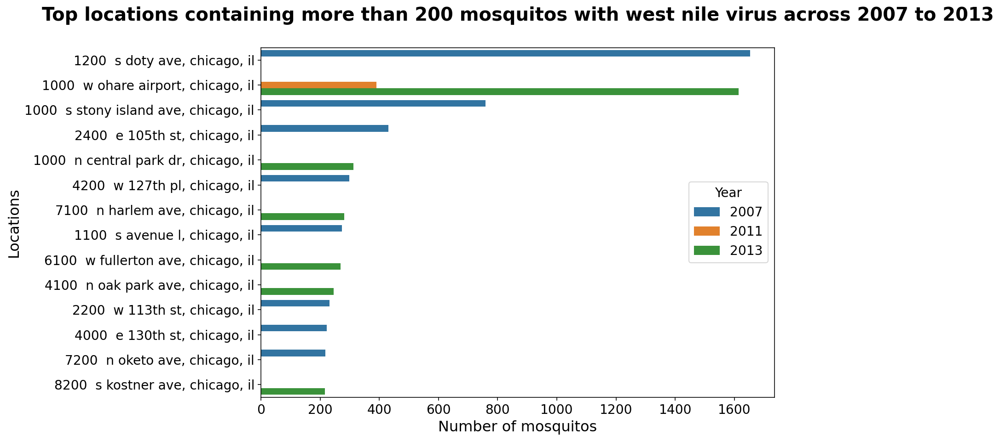

In [32]:
# Grouping the number of mosquitos with west nile virus for each address in each year
train_dt_add_num = train_df[train_df.wnvpresent == 1].groupby(["date","addressnumberandstreet"]).sum()[['nummosquitos']].reset_index()
train_dt_add_num_yr = train_dt_add_num.groupby([train_dt_add_num.date.dt.year, "addressnumberandstreet"]).sum()[['nummosquitos']].reset_index()
train_dt_add_num_yr = train_dt_add_num_yr.rename(columns = {"date": "year"})

# Filtering and grouping the top locations containing more than 200 mosquitos with west nile virus across 2007 to 2013F
train_dt_add_num_200 = train_dt_add_num_yr[train_dt_add_num_yr.nummosquitos>200].sort_values(by="nummosquitos", ascending = False)
plot_barplot(train_dt_add_num_200,'nummosquitos', 'addressnumberandstreet', 'year', "Top locations containing more than 200 mosquitos with west nile virus across 2007 to 2013", "Number of mosquitos","Locations", "Year",'h', 7)

**Analysis: The locations containing an exceptional high number of mosquitos are 1200 s doty avenue (2007), 1000 w ohare airport (2011 and 2013).**

Number of mosquitos of 200 are used to filter the top locations containing exceptionally high number of mosquitos compared to the other locations. In 2007, there are 8 locations, 1 location in 2011 and 6 locations in 2013 that have high number of mosquitos (more than 200 mosquitos) in a year. There is a significant increase of number of mosquitos in 1000 w ohare airport from 2007 to 2013. The absence of 2009 could be due to the low mean average temperature as discussed above. While the low number of west nile virus transmission in 2011 is not known. 

#### 3.5.4 Number of trap locations in Chicago across 2007 to 2013

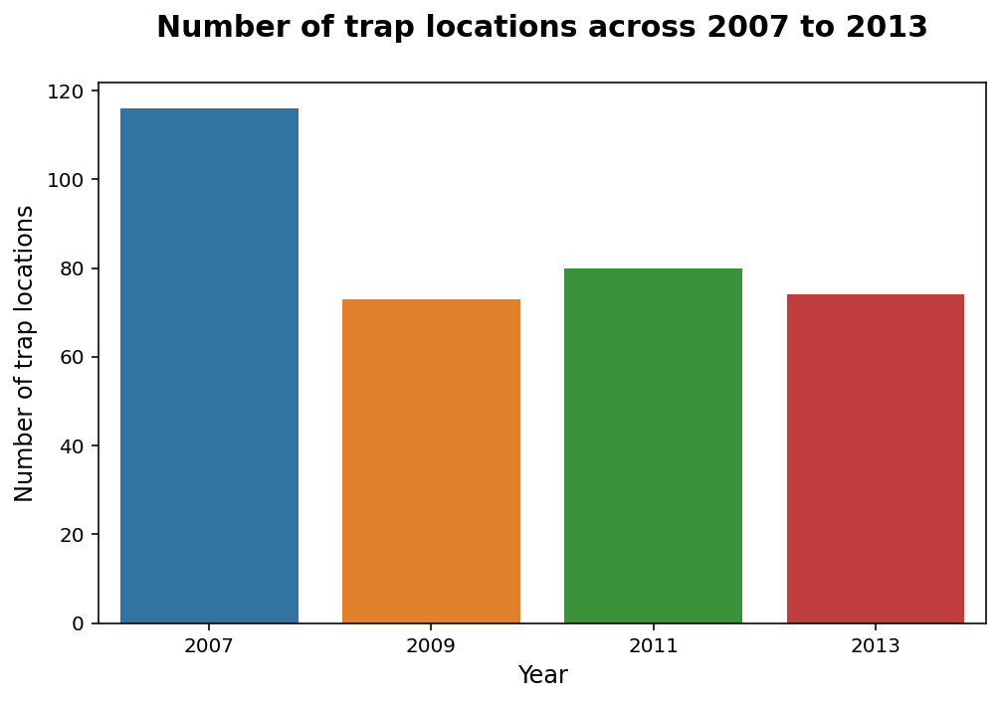

In [33]:
# Grouping the number of trap locations across 2007 to 2013
train_yr_trap = train_df.groupby([train_df.date.dt.year, "trap"]).size().reset_index()
train_yr_traploc = pd.DataFrame([[2007,len(train_yr_trap[train_yr_trap.date == 2007])], [2009, len(train_yr_trap[train_yr_trap.date == 2009])], [2011,len(train_yr_trap[train_yr_trap.date == 2011])],[2013,len(train_yr_trap[train_yr_trap.date == 2013])]], columns = ["year", 'total_trap_locations'])

# Plot barplot
plt.figure(figsize = (8,5))
sns.barplot(x = 'year', y = 'total_trap_locations', data = train_yr_traploc, orient = 'v')
plt.xlabel("Year", fontsize = 12)
plt.ylabel("Number of trap locations", fontsize = 12)
plt.title(("Number of trap locations across 2007 to 2013" +"\n"), weight = 'bold', fontsize = 15);

**Analysis: There is a significantly higher proportion of trap locations in 2007 in comparison with other years. This might explain the high number of mosquitos present in 2007.**

**Summary**
* Majority of the mosquito species for both with and without west nile virus caught in the trap belongs to *culex pipiens* or *culex restuans*.
* There is a high proportion of number of mosquitos present in Chicago in 2007 could be due to the high number of trap locations in comparison with other years. The number of mosquitos with west nile virus are high in 2007 and 2013.**
* The locations containing an exceptional high number of mosquitos are 1200 s doty avenue (2007), 1000 w ohare airport (2011 and 2013).

### 3.6 Analysis - Mosquitos locations and the spray of mosquitos in Chicago

#### 3.6.1 Locations of mosquitos with west nile virus in Chicago across 2007 to 2013

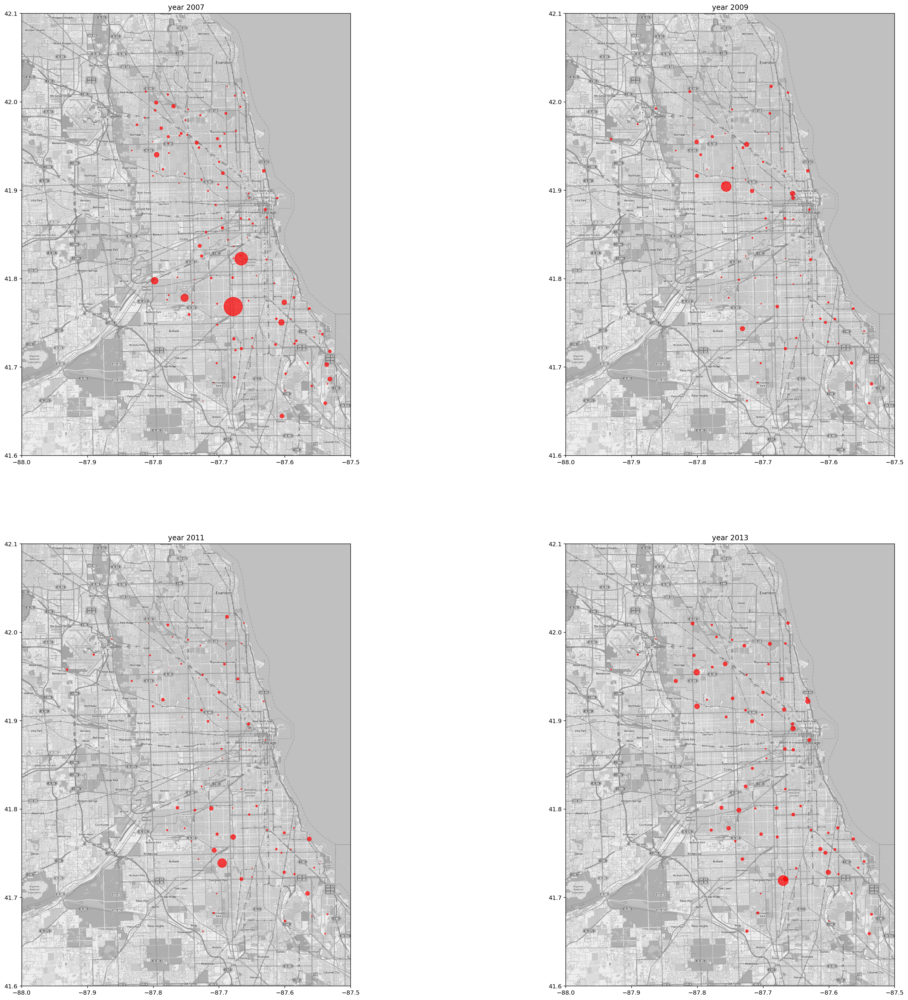

In [34]:
virus2007 = train_df[(train_df.nummosquitos > 0) & (train_df.date.apply(lambda x: x.year) == 2007)]
virus2009 = train_df[(train_df.nummosquitos > 0) & (train_df.date.apply(lambda x: x.year) == 2009)]
virus2011 = train_df[(train_df.nummosquitos > 0) & (train_df.date.apply(lambda x: x.year) == 2011)]
virus2013 = train_df[(train_df.nummosquitos > 0) & (train_df.date.apply(lambda x: x.year) == 2013)]

plt.figure(figsize=(30,30))
plt.subplot(2,2,1)
plt.gca().set_title('year 2007')
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
locations = virus2007[['longitude', 'latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], color = 'red', s = virus2007.groupby(['trap']).sum().nummosquitos/20, alpha = 0.7)

plt.subplot(2,2,2)
plt.gca().set_title('year 2009')
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
locations = virus2009[['longitude', 'latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], color = 'red', s = virus2009.groupby(['trap']).sum().nummosquitos/20, alpha = 0.7)

plt.subplot(2,2,3)
plt.gca().set_title('year 2011')
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
locations = virus2011[['longitude', 'latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], color = 'red', s = virus2011.groupby(['trap']).sum().nummosquitos/20, alpha = 0.7)

plt.subplot(2,2,4)
plt.gca().set_title('year 2013')
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
locations = virus2013[['longitude', 'latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], color = 'red', s = virus2013.groupby(['trap']).sum().nummosquitos/20, alpha = 0.7)

plt.savefig(f'../imgs/mosquitos_map.png')

From the diagram above the red spots are the numbers of moquitoes in the area, the larger the dots are the more the mosquitoes. As we can see as well in the 2007 there was quite a number of spread all throughout the city. The numbers and area decreased in 2009 and 2011 but increased again in 2013.

#### 3.6.2 Spray of mosquitos in 2013

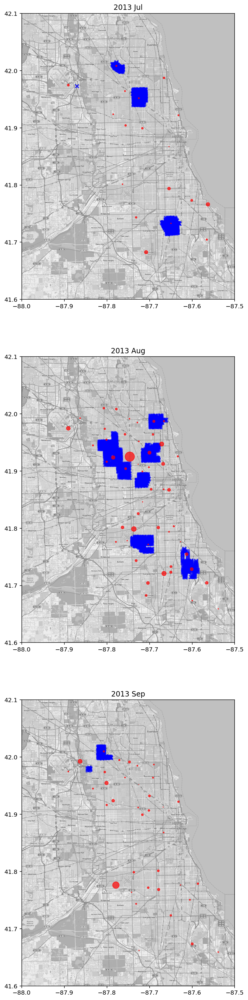

In [35]:
virus2013 = train_df[(train_df.wnvpresent > 0) & (train_df.date.apply(lambda x: x.year) == 2013)]
spray2013 = spray_df[(spray_df.date.apply(lambda x: x.year) == 2013)]

virus2013_7 = virus2013[(virus2013.wnvpresent > 0) & (virus2013.date.apply(lambda x: x.month) == 7)]
virus2013_8 = virus2013[(virus2013.wnvpresent > 0) & (virus2013.date.apply(lambda x: x.month) == 8)]
virus2013_9 = virus2013[(virus2013.wnvpresent > 0) & (virus2013.date.apply(lambda x: x.month) == 9)]
spray2013_7 = spray2013[(spray2013.date.apply(lambda x: x.month) == 7)]
spray2013_8 = spray2013[(spray2013.date.apply(lambda x: x.month) == 8)]
spray2013_9 = spray2013[(spray2013.date.apply(lambda x: x.month) == 9)]

plt.figure(figsize=(30,30))
plt.subplot(3,1,1)
plt.gca().set_title('2013 Jul')
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
virusloc = virus2013_7[['longitude', 'latitude']].drop_duplicates().values
sprayloc = spray2013_7[['longitude', 'latitude']].drop_duplicates().values
plt.scatter(sprayloc[:,0], sprayloc[:,1], color = 'blue', marker= 'x', alpha = 0.3)
plt.scatter(virusloc[:,0], virusloc[:,1], color = 'red', marker= '.', s = virus2013_7.groupby(['trap']).sum().nummosquitos, alpha = 0.7)

plt.subplot(3,1,2)
plt.gca().set_title('2013 Aug')
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
virusloc = virus2013_8[['longitude', 'latitude']].drop_duplicates().values
sprayloc = spray2013_8[['longitude', 'latitude']].drop_duplicates().values
plt.scatter(sprayloc[:,0], sprayloc[:,1], color = 'blue', marker= 'x', alpha = 0.3)
plt.scatter(virusloc[:,0], virusloc[:,1], color = 'red', marker= '.', s = virus2013_8.groupby(['trap']).sum().nummosquitos, alpha = 0.7)


plt.subplot(3,1,3)
plt.gca().set_title('2013 Sep')
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
virusloc = virus2013_9[['longitude', 'latitude']].drop_duplicates().values
sprayloc = spray2013_9[['longitude', 'latitude']].drop_duplicates().values
plt.scatter(sprayloc[:,0], sprayloc[:,1], color = 'blue', marker= 'x', alpha = 0.3)
plt.scatter(virusloc[:,0], virusloc[:,1], color = 'red', marker= '.', s = virus2013_9.groupby(['trap']).sum().nummosquitos, alpha = 0.7)

plt.savefig(f'../imgs/mosquitos_spray_map.png')

Taking a more detailed look into the year 2013 where spraying of pesticide was recorded, we see that in the area sprayed the following month show less outbreak within the area and overall reducing the number of mosquitoes in general as well.

However the spray locations are not effective as they do not target the larger cluster of moquitoes

### 3.7 Train/Test-Split

* Map the species to integer
* Dummify the trap
* Drop the addressnumberandstreet and nummosquitos columns

In [36]:
def species_to_number(species):
    """
    Input: list of species by name 
    Output: list of species serialised
    """
    species_list = ['UNSPECIFIED CULEX',
                    'CULEX ERRATICUS',
                    'CULEX PIPIENS',
                    'CULEX PIPIENS/RESTUANS',
                    'CULEX RESTUANS',
                    'CULEX SALINARIUS',
                    'CULEX TARSALIS',
                    'CULEX TERRITANS']
    for i in range(0,8):
        if species == species_list[i].lower():
            return i

In [37]:
# Map the mosquitos to species to specific integers
train_df.species = train_df.species.map(lambda x : species_to_number(x))
test_df.species = test_df.species.map(lambda x : species_to_number(x))

# Dummify the traps
train_df.trap = train_df.trap.str.replace(r'[A-S]', "")
train_df = pd.get_dummies(train_df,columns=['trap'])

test_df.trap = test_df.trap.str.replace(r'[A-S]', "")
test_df = pd.get_dummies(test_df,columns=['trap'])
test_df = test_df.drop('trap_T234', axis =1)

# Drop the addressnumberandstreet and nummosquitos
train_df = train_df.drop(['addressnumberandstreet','nummosquitos'], axis =1)
test_df = test_df.drop('addressnumberandstreet', axis =1)

### 3.8. Summary

1. We found a high correlation between the number of mosquitos and weather features such as precipitation, Relative Humidity, temperature, 
as well as some weather phenomena - for example rain, drizzle, and thunderstorms
2. The mosquito populations peaked between July and August each year. This coincided with the time of the year when it started
to get warmer, and there was more rain and humidity
3. Two species of mosquitos in particular had a much higher population than the others - Culex Pipiens and Culex Restuans.
4. There was a higher mosquito population in certain locations, but these locations were not where spraying efforts were previously done.

These will likely be the key features for our model in predicting the probability of WNV presence for given locations and time periods.

## Exporting Data

In [38]:
# train_df.to_csv("../data/train_df_model.csv", index = False)
# test_df.to_csv("../data/test_df_model.csv", index = False)

## References

[1] "Atmospheric Pressure," *Britannica The Editors of Encyclopedia*, May 27, 2020. [Online]. Available: [https://www.britannica.com/science/atmospheric-pressure](https://www.britannica.com/science/atmospheric-pressure) [Accessed: May. 1, 2021].  

[2] "Humidity Formulas," *Go Grean*, 2014. [Online]. Available: [http://www.reahvac.com/tools/humidity-formulas/](http://www.reahvac.com/tools/humidity-formulas/) [Accessed: May. 1, 2021].

[3] "House Mosquitoes," *Biogents USA*. [Online]. Available: [https://us.biogents.com/house-mosquitoes/](https://us.biogents.com/house-mosquitoes/) [Accessed: May. 6, 2021].
 
[4] "Rising temperatures could shift US West Nile virus transmission," *ScienceDaily*, September 15, 2020. [Online]. Available: [https://www.sciencedaily.com/releases/2020/09/200915105932.htm#:~:text=West%20Nile%20virus%20spreads%20most,published%20today%20in%20eLife%20shows.](https://www.sciencedaily.com/releases/2020/09/200915105932.htm#:~:text=West%20Nile%20virus%20spreads%20most,published%20today%20in%20eLife%20shows.) [Accessed: May. 6, 2021]